In [1]:
import os
import glob

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde
import plotly.graph_objects as go
import plotly.express as px

from collections.abc import Callable
from IPython.display import display

pd.set_option('display.max_rows', 200)

In [2]:
def read_dataset_part(dataset_part: str):
    file_in_parts_pattern = os.path.join(path, f"results_{dataset_part}_part*.csv")
    part_files = sorted(glob.glob(file_in_parts_pattern))

    if part_files:
        print(f"Merging {len(part_files)} part files")
        df = pd.concat((pd.read_csv(f) for f in part_files), ignore_index=True)
    else:
        single_file = os.path.join(path, f"results_{dataset_part}.csv")
        df = pd.read_csv(single_file)

    return df

In [3]:
dataset_types = ["institutions", "institution_subnets", "ip_addresses_sample"]
metric_for_eval = "RMSE"
column_subset = ["n_bytes", "n_flows", "n_packets"]

training_window_specific = 24
prediction_window_specific = 1

path = "./results/"

df_dict = {dt: read_dataset_part(dt) for dt in dataset_types}
models = list(df_dict["institutions"]["MODEL"].drop_duplicates())

Merging 2 part files


### Cut off for metrics

In [4]:
for key, df in df_dict.items():
    df["RMSE"] = df["RMSE"].apply(lambda x: 11 if x > 11 else x)
    df = df[~df["RMSE"].isna()]
    df_dict[key] = df

In [5]:
def do_for_all(df_dict: dict, func: Callable, *args, **kwargs):
    """
    Applies the given function `func` to every DataFrame in `df_dict`.
    Additional positional and keyword arguments can be passed through.
    
    Parameters
    ----------
    df_dict : dict
        Dictionary of DataFrames.
    func : callable
        A function that takes a DataFrame as the first argument.
    *args : tuple
        Any additional positional arguments for `func`.
    **kwargs : dict
        Any additional keyword arguments for `func`.
    
    Returns
    -------
    dict
        Dictionary of results, with the same keys as `df_dict`.
    """
    
    df_results = [] 
    for name, df in df_dict.items():
        result = func(df, *args, **kwargs)
        result = result.add_suffix(f"_{name}")
        df_results.append(result)
    combined_df = pd.concat(df_results, axis=1)
    display(combined_df)



### Compare models overall

In [6]:
do_for_all(
    df_dict,
    lambda df: df.groupby("MODEL")[[metric_for_eval]].mean()
)

,RMSE_institutions,RMSE_institution_subnets,RMSE_ip_addresses_sample
MODEL,,,
ETSformer,0.110751,0.143287,0.132931
GRU,0.112323,0.146804,0.119045
GRU-FCN,0.119114,0.154453,0.125308
InceptionTime,0.211252,0.247664,0.273160
LSTM,0.114044,0.148913,0.119436
LSTM-FCN,0.123826,0.158891,0.124066
Mean,0.151515,0.229548,0.310751
RCLSTM,0.192340,0.238400,0.150364
ResNet,0.153556,0.188871,0.141343


### Compare training and prediction windows combinations

In [7]:
do_for_all(
    df_dict,
    lambda df: df.groupby(by=["TRAINING_WINDOW", "PREDICTION_WINDOW"])[[metric_for_eval]].mean()
)

RMSE_institutions  \
TRAINING_WINDOW PREDICTION_WINDOW                      
24              1                           0.099056   
                24                          0.051894   
168             1                           0.106388   
                24                          0.171579   
                168                         0.101171   
744             1                           0.124465   
                168                         0.214336   

                                   RMSE_institution_subnets  \
TRAINING_WINDOW PREDICTION_WINDOW                             
24              1                                  0.141978   
                24                                 0.070841   
168             1                                  0.148259   
                24                                 0.213931   
                168                                0.118994   
744             1                                  0.164768   
                168                                0.251458   

                                   RMSE_ip_addresses_sample  
TRAINING_WINDOW PREDICTION_WINDOW                            
24              1                                  0.136200  
                24                                 0.067188  
168             1                                  0.142225  
                24                                 0.196398  
                168                                0.097554  
744             1                                  0.150014  
                168                                0.212371

### Compare model, training and prediction windows combinations

In [8]:
do_for_all(
    df_dict,
    lambda df: df.groupby(by=["MODEL", "TRAINING_WINDOW", "PREDICTION_WINDOW"])[[metric_for_eval]].mean()
)

RMSE_institutions  \
MODEL         TRAINING_WINDOW PREDICTION_WINDOW                      
ETSformer     24              1                           0.090026   
              168             1                           0.085112   
                              24                          0.129678   
              744             1                           0.084716   
                              168                         0.164222   
GRU           24              1                           0.088463   
              168             1                           0.088931   
                              24                          0.137840   
              744             1                           0.089809   
                              168                         0.156574   
GRU-FCN       24              1                           0.089165   
              168             1                           0.095987   
                              24                          0.125990   
              744             1                           0.123793   
                              168                         0.160637   
InceptionTime 24              1                           0.100563   
              168             1                           0.123453   
                              24                          0.333109   
              744             1                           0.159444   
                              168                         0.339692   
LSTM          24              1                           0.090506   
              168             1                           0.090986   
                              24                          0.140542   
              744             1                           0.091814   
                              168                         0.156371   
LSTM-FCN      24              1                           0.090300   
              168             1                           0.097908   
                              24                          0.135499   
              744             1                           0.134441   
                              168                         0.160980   
Mean          24              1                           0.137010   
              168             1                           0.148874   
                              24                          0.151091   
              744             1                           0.158539   
                              168                         0.162059   
RCLSTM        24              1                           0.108870   
              168             1                           0.111115   
                              24                          0.210822   
              744             1                           0.096529   
                              168                         0.433943   
ResNet        24              1                           0.096794   
              168             1                           0.115366   
                              24                          0.179716   
              744             1                           0.181364   
                              168                         0.194540   
lstmae        24              24                          0.051894   
              168             168                         0.101171   

                                                 RMSE_institution_subnets  \
MODEL         TRAINING_WINDOW PREDICTION_WINDOW                             
ETSformer     24              1                                  0.118203   
              168             1                                  0.114778   
                              24                                 0.162032   
              744             1                                  0.114384   
                              168                                0.207038   
GRU           24              1                                  0.124380   
  

### Compare metrics

In [9]:
do_for_all(
    df_dict,
    lambda df: df.groupby(by=["TS_METRIC"])[[metric_for_eval]].mean()
)

,RMSE_institutions,RMSE_institution_subnets,RMSE_ip_addresses_sample
TS_METRIC,,,
average_n_dest_asn,0.114898,0.124451,0.122561
average_n_dest_ip,0.146069,0.157071,0.124340
average_n_dest_ports,0.131255,0.122082,0.156026
avg_duration,0.174590,0.218516,0.151384
avg_ttl,0.116755,0.150719,0.228442
dir_ratio_bytes,0.138950,0.147260,0.142458
dir_ratio_packets,0.132300,0.143770,0.147156
n_bytes,0.145655,0.289511,0.295822
n_flows,0.197404,0.255706,0.170864


### Compare models & attribute subset

In [10]:
df_dict_filt = {key: df[df["TS_METRIC"].isin(column_subset)] for key, df in df_dict.items()}

do_for_all(
    df_dict_filt,
    lambda df: df.groupby(by=["MODEL", "TS_METRIC"])[[metric_for_eval]].mean()
)

RMSE_institutions  RMSE_institution_subnets  \
MODEL         TS_METRIC                                                
ETSformer     n_bytes             0.148285                  0.301266   
              n_flows             0.151216                  0.205341   
              n_packets           0.149915                  0.246214   
GRU           n_bytes             0.121289                  0.243339   
              n_flows             0.172678                  0.217748   
              n_packets           0.127482                  0.220542   
GRU-FCN       n_bytes             0.120150                  0.243859   
              n_flows             0.178104                  0.221459   
              n_packets           0.125861                  0.221149   
InceptionTime n_bytes             0.275510                  0.396210   
              n_flows             0.292073                  0.341734   
              n_packets           0.275936                  0.370668   
LSTM          n_bytes             0.121688                  0.243552   
              n_flows             0.174911                  0.218768   
              n_packets           0.128068                  0.221142   
LSTM-FCN      n_bytes             0.120156                  0.243790   
              n_flows             0.182470                  0.224992   
              n_packets           0.127270                  0.222184   
Mean          n_bytes             0.152837                  0.419469   
              n_flows             0.220844                  0.380710   
              n_packets           0.162057                  0.390403   
RCLSTM        n_bytes             0.152398                  0.314093   
              n_flows             0.211680                  0.276195   
              n_packets           0.142564                  0.277944   
ResNet        n_bytes             0.137243                  0.257307   
              n_flows             0.220651                  0.260120   
              n_packets           0.146525                  0.241332   
lstmae        n_bytes             0.049391                  0.146307   
              n_flows             0.128063                  0.141751   
              n_packets           0.049602                  0.108156   

                         RMSE_ip_addresses_sample  
MODEL         TS_METRIC                            
ETSformer     n_bytes                    0.194812  
              n_flows                    0.119189  
              n_packets                  0.153596  
GRU           n_bytes                    0.161387  
              n_flows                    0.111606  
              n_packets                  0.120501  
GRU-FCN       n_bytes                    0.169425  
              n_flows                    0.117210  
              n_packets                  0.127938  
InceptionTime n_bytes                    0.341130  
              n_flows                    0.278995  
              n_packets                  0.301092  
LSTM          n_bytes                    0.161725  
              n_flows                    0.111929  
              n_packets                  0.120995  
LSTM-FCN      n_bytes                    0.165571  
              n_flows                    0.116074  
              n_packets                  0.124501  
Mean          n_bytes                    1.101750  
              n_flows                    0.436157  
              n_packets                  0.634861  
RCLSTM        n_bytes                    0.228043  
              n_flows                    0.139725  
              n_packets                  0.181785  
ResNet        n_bytes                    0.167547  
              n_flows                    0.125433  
              n_packets                  0.126434  
lstmae        n_bytes                    0.087915  
              n_flows                    0.080813  
              n_packets                  0.057686

In [11]:
do_for_all(
    df_dict_filt,
    lambda df: df.groupby(by=["MODEL", "TRAINING_WINDOW", "PREDICTION_WINDOW", "TS_METRIC"])[[metric_for_eval]].mean()
)

RMSE_institutions  \
MODEL         TRAINING_WINDOW PREDICTION_WINDOW TS_METRIC                      
ETSformer     24              1                 n_bytes             0.133846   
                                                n_flows             0.121576   
                                                n_packets           0.133527   
              168             1                 n_bytes             0.132242   
                                                n_flows             0.112667   
                                                n_packets           0.131526   
                              24                n_bytes             0.161473   
                                                n_flows             0.192578   
                                                n_packets           0.165856   
              744             1                 n_bytes             0.132611   
                                                n_flows             0.110599   
                                                n_packets           0.132122   
                              168               n_bytes             0.181254   
                                                n_flows             0.218659   
                                                n_packets           0.186543   
GRU           24              1                 n_bytes             0.103674   
                                                n_flows             0.143785   
                                                n_packets           0.108888   
              168             1                 n_bytes             0.104850   
                                                n_flows             0.145572   
                                                n_packets           0.109641   
                              24                n_bytes             0.123085   
                                                n_flows             0.207560   
                                                n_packets           0.132607   
              744             1                 n_bytes             0.106254   
                                                n_flows             0.146183   
                                                n_packets           0.109546   
                              168               n_bytes             0.168584   
                                                n_flows             0.220289   
                                                n_packets           0.176728   
GRU-FCN       24              1                 n_bytes             0.102227   
                                                n_flows             0.144573   
                                                n_packets           0.105635   
              168             1                 n_bytes             0.103505   
                                                n_flows             0.154692   
                                                n_packets           0.107721   
                              24                n_bytes             0.115461   
                                                n_flows             0.192908   
                                                n_packets           0.123999   
              744             1                 n_bytes             0.110917   
                                                n_flows             0.183062   
                                                n_packets           0.118659   
                              168               n_bytes             0.168643   
                                                n_flows             0.215285   
                                                n_packets           0.173291   
InceptionTime 24              1                 n_bytes             0.112188   
                                                n_flows             0.155791   
                                                n_packets           0.115300   
              168             1                 n_bytes    

### KDEs of the selected combination

In [12]:
df_dict_2 = {key: df[(df['PREDICTION_WINDOW'] == prediction_window_specific) & (df['TRAINING_WINDOW'] == training_window_specific)] for key, df in df_dict.items()}

do_for_all(
    df_dict_2,
    lambda df: df.groupby(by=["MODEL"])[[metric_for_eval]].mean()
)

,RMSE_institutions,RMSE_institution_subnets,RMSE_ip_addresses_sample
MODEL,,,
ETSformer,0.090026,0.118203,0.114763
GRU,0.088463,0.124380,0.109033
GRU-FCN,0.089165,0.126441,0.107663
InceptionTime,0.100563,0.140796,0.123303
LSTM,0.090506,0.127148,0.109815
LSTM-FCN,0.090300,0.127636,0.108807
Mean,0.137010,0.208222,0.302425
RCLSTM,0.108870,0.168351,0.124103
ResNet,0.096794,0.136588,0.113735


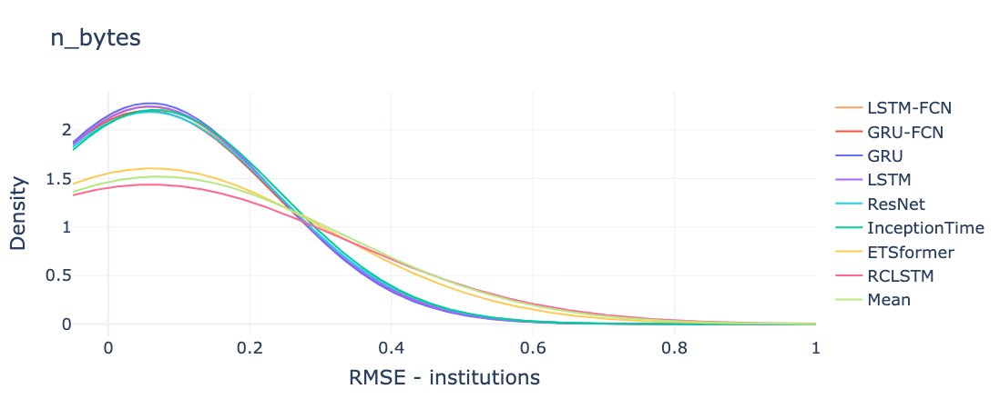

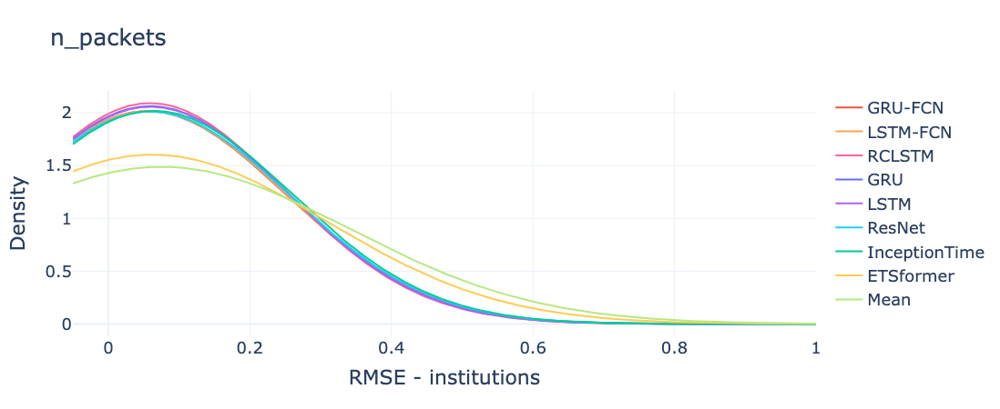

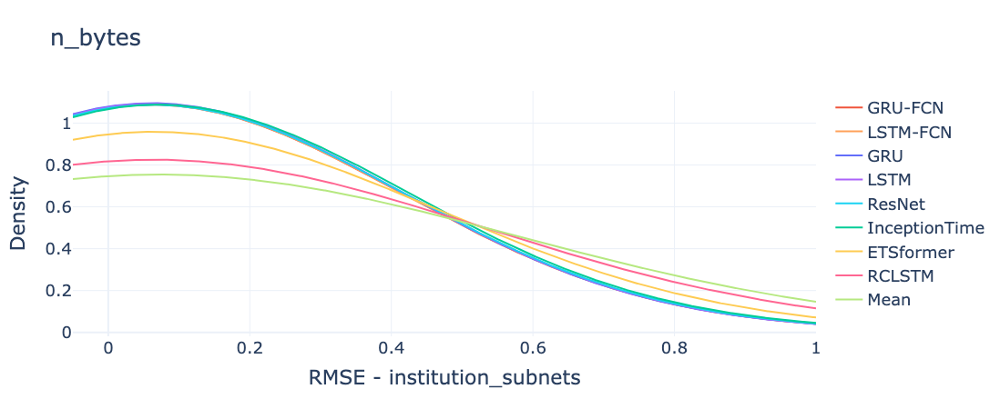

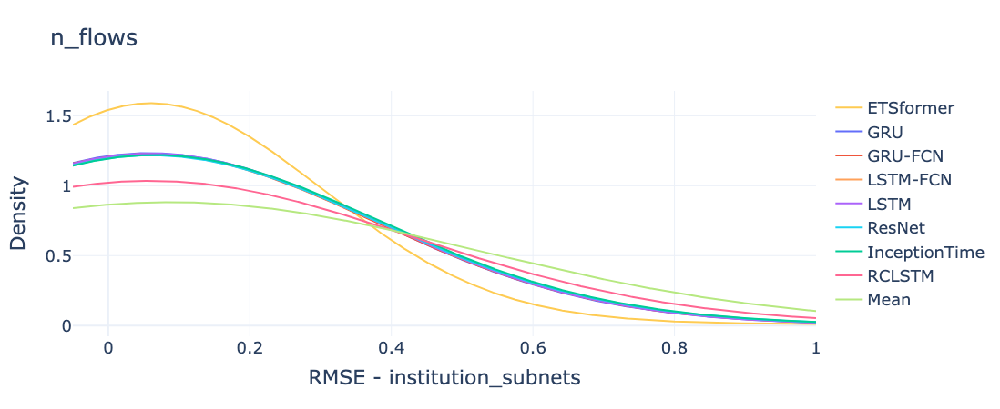

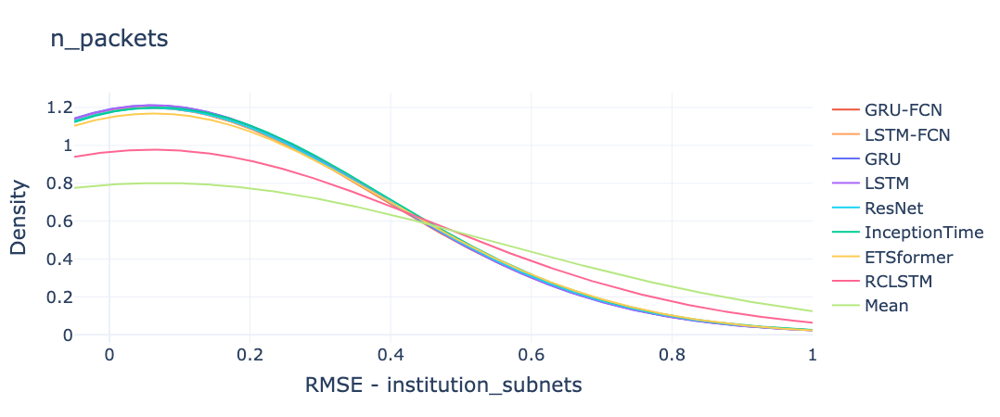

In [13]:
colormap = px.colors.qualitative.Plotly  # Predefined color sequence
identifier_to_color = {id_: colormap[i % len(colormap)] for i, id_ in enumerate(models)}
for subset, df_2 in df_dict_2.items():
    for column in column_subset:
    
        fig = go.Figure()
    
        mean_results = {}
        for model in models:
            tmp = df_2[(df_2['TS_METRIC'] == column) & (df_2['MODEL'] == model)]
            if tmp.shape[0] == 0:
                continue
            mean_results[model] = tmp[metric_for_eval].mean()
            
            
        for model in sorted(mean_results, key=lambda k: mean_results[k]):
            tmp = df_2[(df_2['TS_METRIC'] == column) & (df_2['MODEL'] == model)]
            if tmp.shape[0] == 0:
                continue
            
            kde = gaussian_kde(tmp[metric_for_eval].values)
            fig.add_trace(go.Scatter(
                    x=np.linspace(-0.05, 1, 1000),
                    y=kde(np.linspace(-0.05, 1, 1000)),
                    mode='lines',
                    name=f"{model}",
                    marker=dict(color=identifier_to_color[model], size=10),
                ))
        fig.update_layout(
                title=column,
                xaxis_title=f'{metric_for_eval} - {subset}',
                yaxis_title='Density',
                template='plotly_white',
                showlegend=True,
                font=dict(size=18),
                height=450
            )
    
        # Show the plot
        fig.show()


In [14]:
mapping = {"institutions": "ins",
           "institution_subnets": "subs",
           "ip_addresses_sample": "ips"}

def plot_kdes(ts_metric):
    i = 0
    fig, axs = plt.subplots(len(models) - 1, len(df_dict_2), figsize=(24,24))
    for subset, df_2 in df_dict_2.items(): 
        j = 0
        for model in models:
            if model == "lstmae":
                continue
            data = df_2[(df_2["TS_METRIC"] == ts_metric) & (df_2["MODEL"] == model)][metric_for_eval]
            log_data = np.log1p(data)

            axs[j][i].hist(log_data, bins=50, edgecolor='black')
            axs[j][i].set_title(f"{model} - {ts_metric} - {mapping[subset]}")
            axs[j][i].set_xlabel(metric_for_eval)
            j += 1
        i += 1
            

    plt.tight_layout()
    plt.show()

### n_bytes - The number of bytes

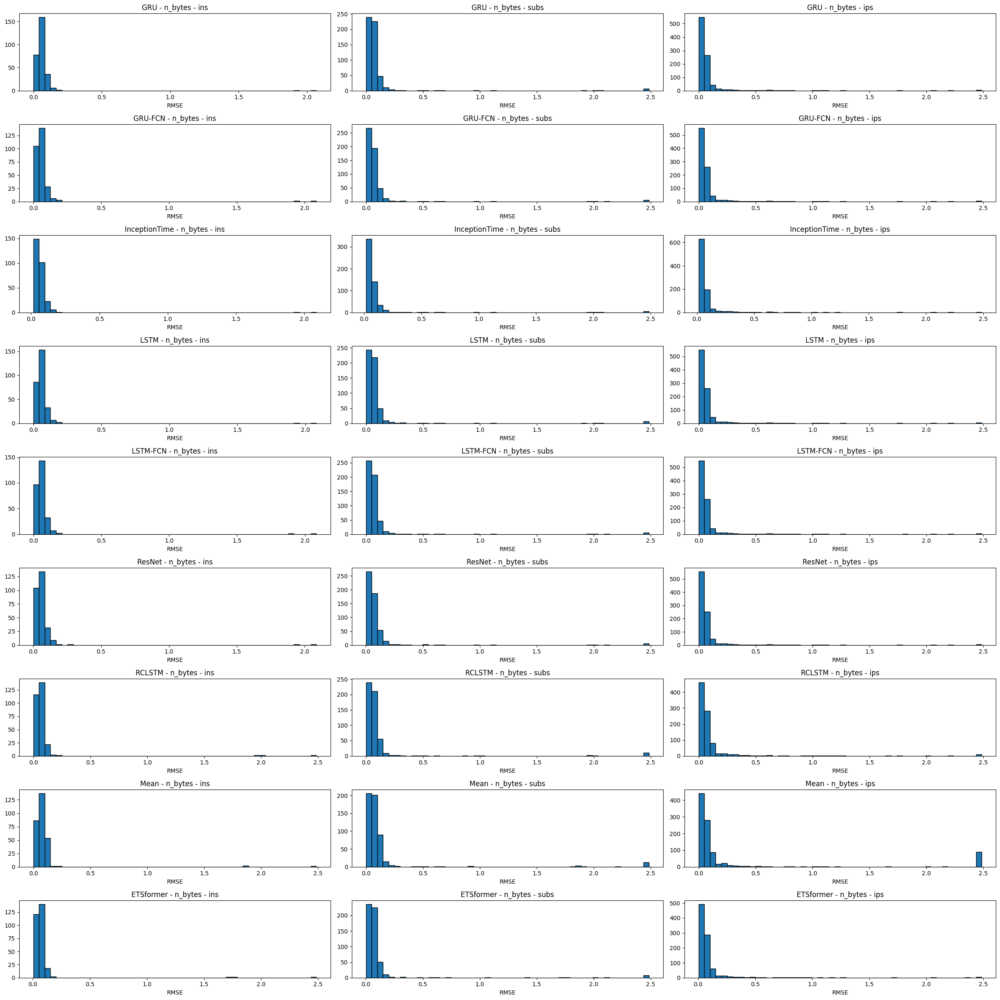

In [15]:
plot_kdes("n_bytes")

### n_flows - The number of flows

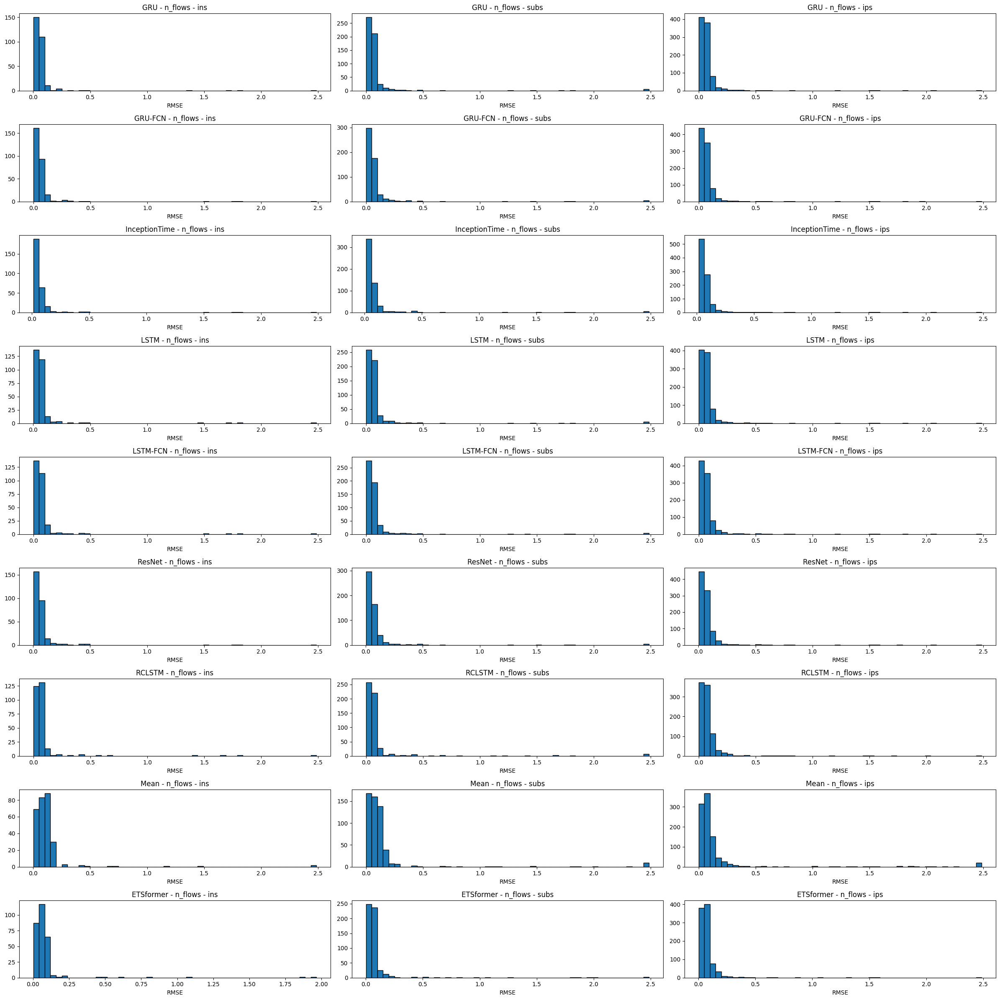

In [16]:
plot_kdes("n_flows")

### n_packets - The number of packets

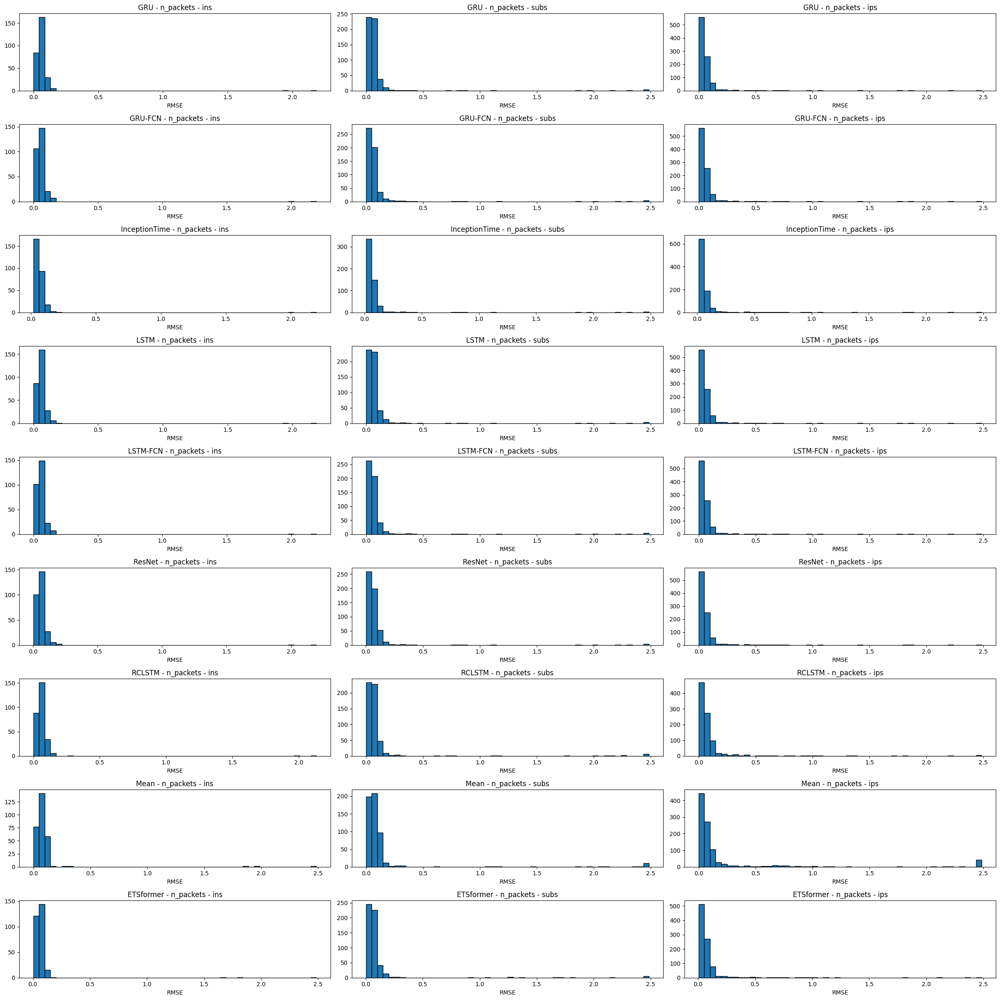

In [17]:
plot_kdes("n_packets")

### tcp_udp_ratio_packets - The TCP/UDP packet ratio

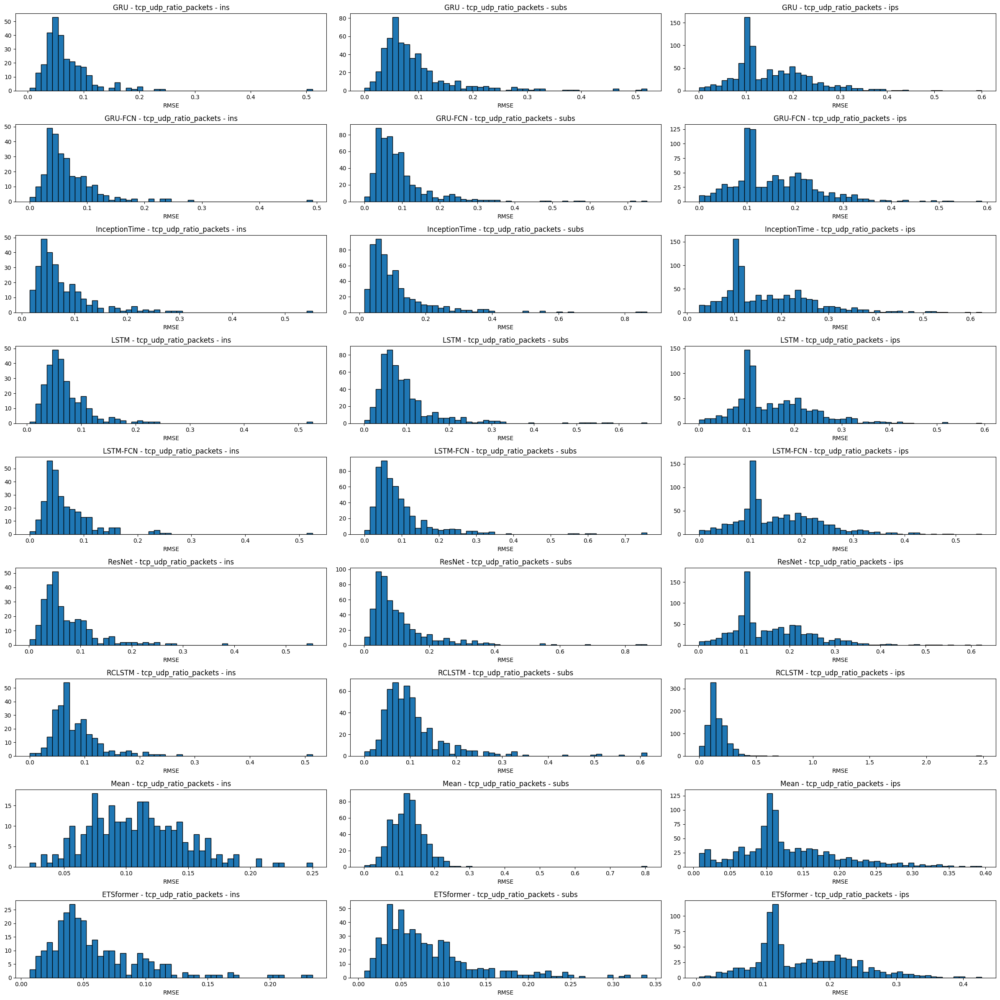

In [18]:
plot_kdes("tcp_udp_ratio_packets")

### tcp_udp_ratio_bytes - The TCP/UDP bytes ratio

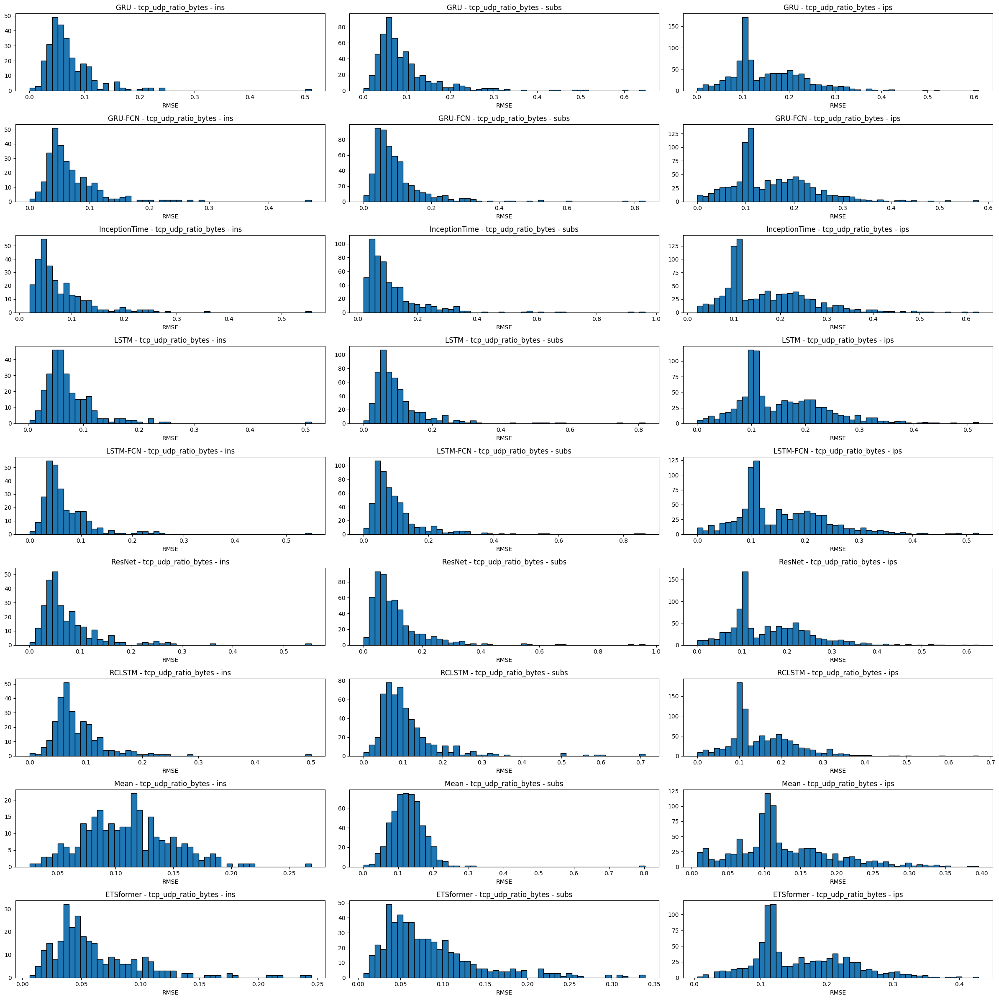

In [19]:
plot_kdes("tcp_udp_ratio_bytes")

### dir_ratio_packets - The directional ratio of packets

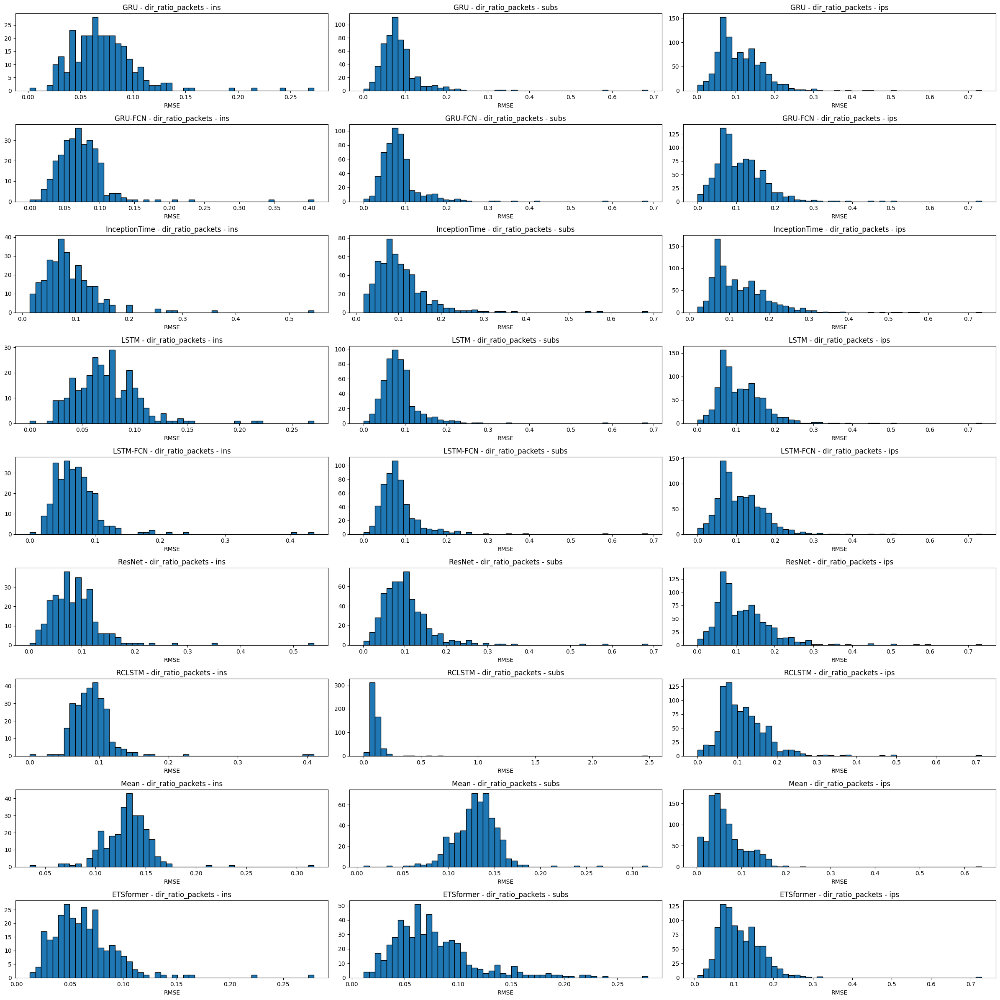

In [20]:
plot_kdes("dir_ratio_packets")

### dir_ratio_bytes - The directional ratio of bytes

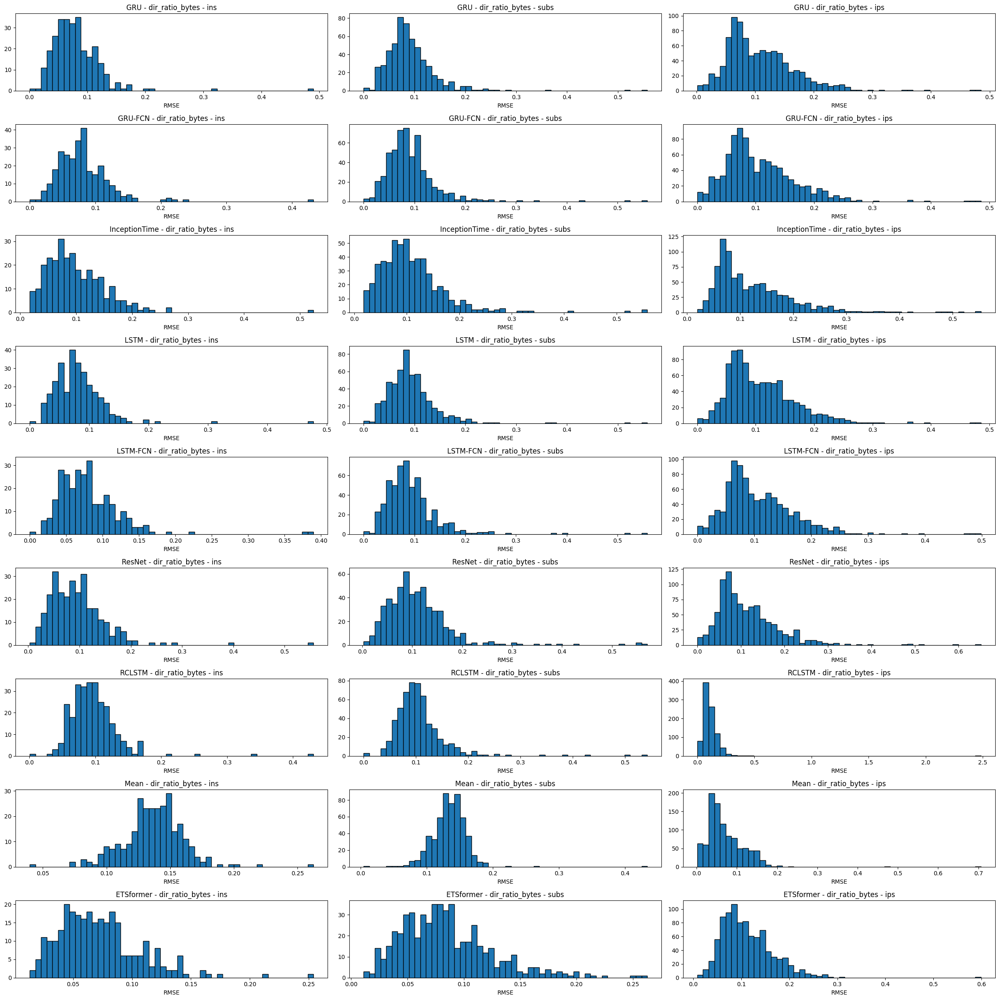

In [21]:
plot_kdes("dir_ratio_bytes")

### avg_ttl - The average TTL

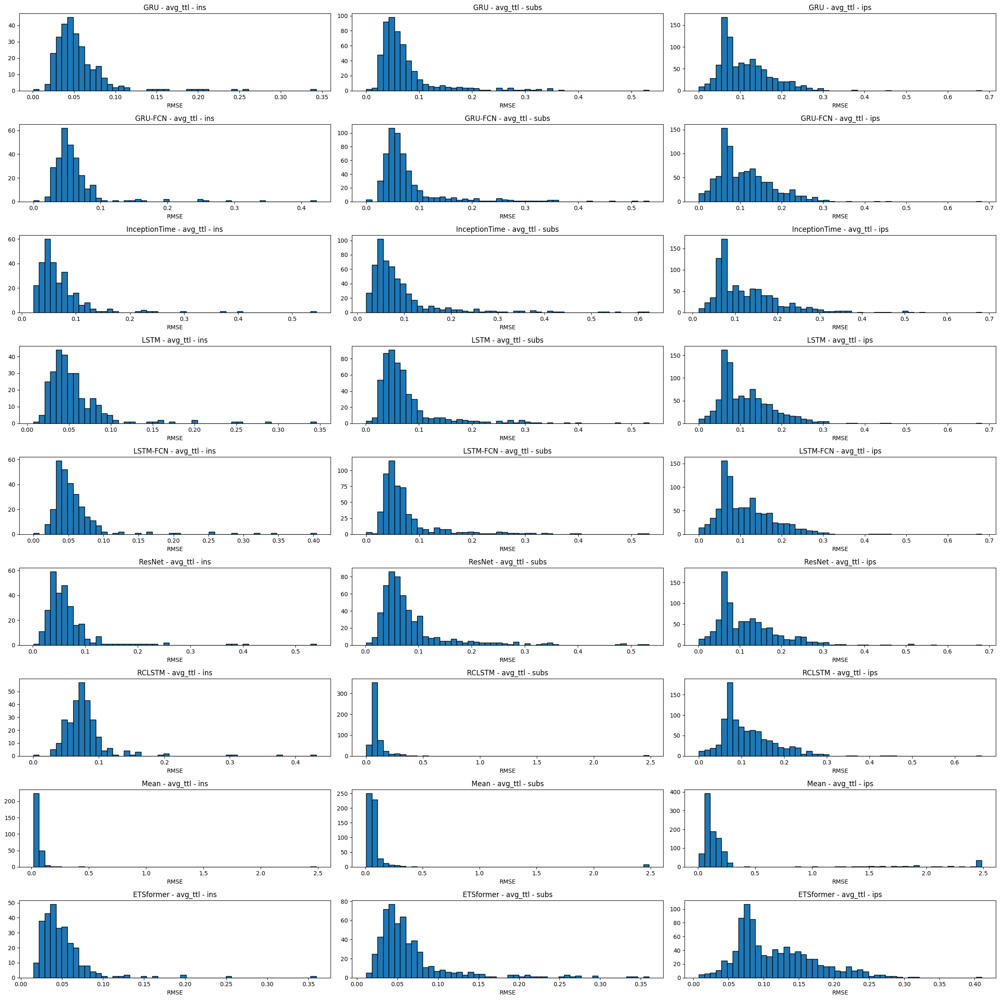

In [22]:
plot_kdes("avg_ttl")

### avg_duration - The average duration

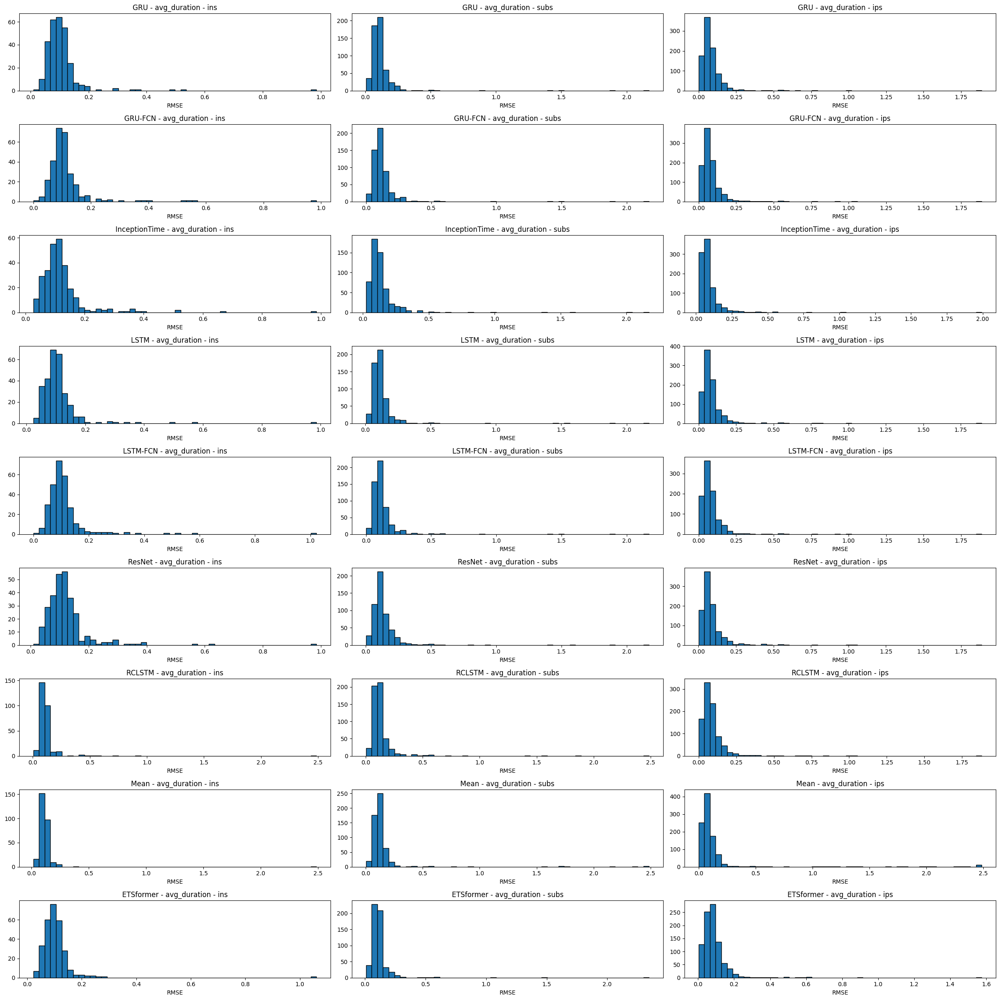

In [23]:
plot_kdes("avg_duration")

### average_n_dest_asn - Average of the number of unique destination ASNs

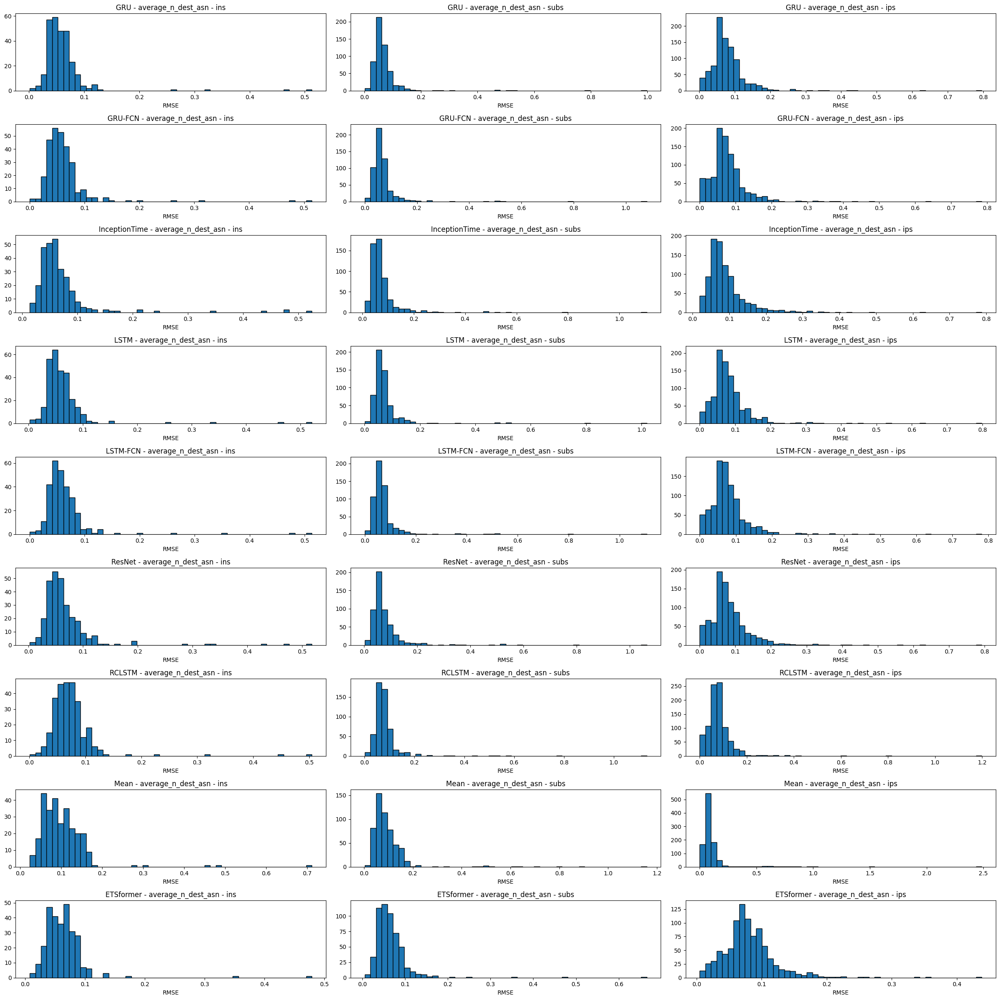

In [24]:
plot_kdes("average_n_dest_asn")

### average_n_dest_ip - Average of the number of unique destination ASNs

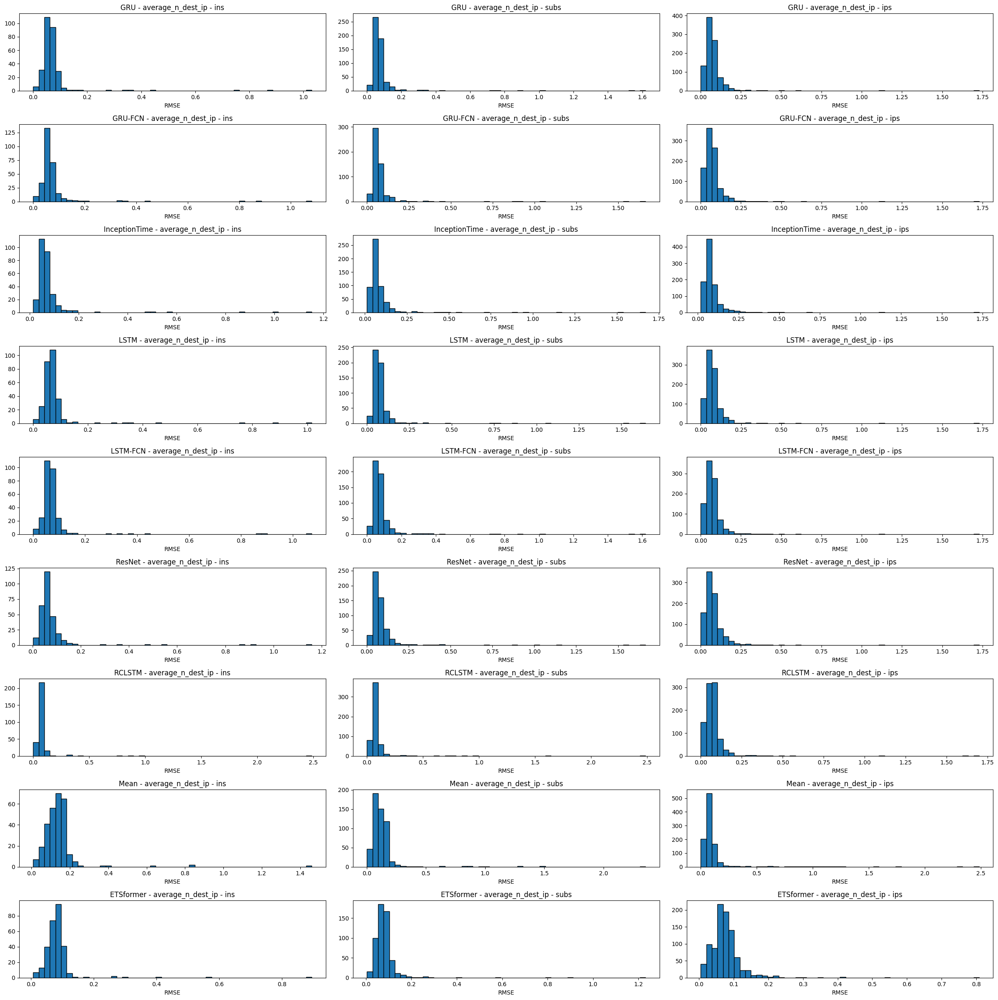

In [25]:
plot_kdes("average_n_dest_ip")

### average_n_dest_ports - Average of the number of unique destination ports

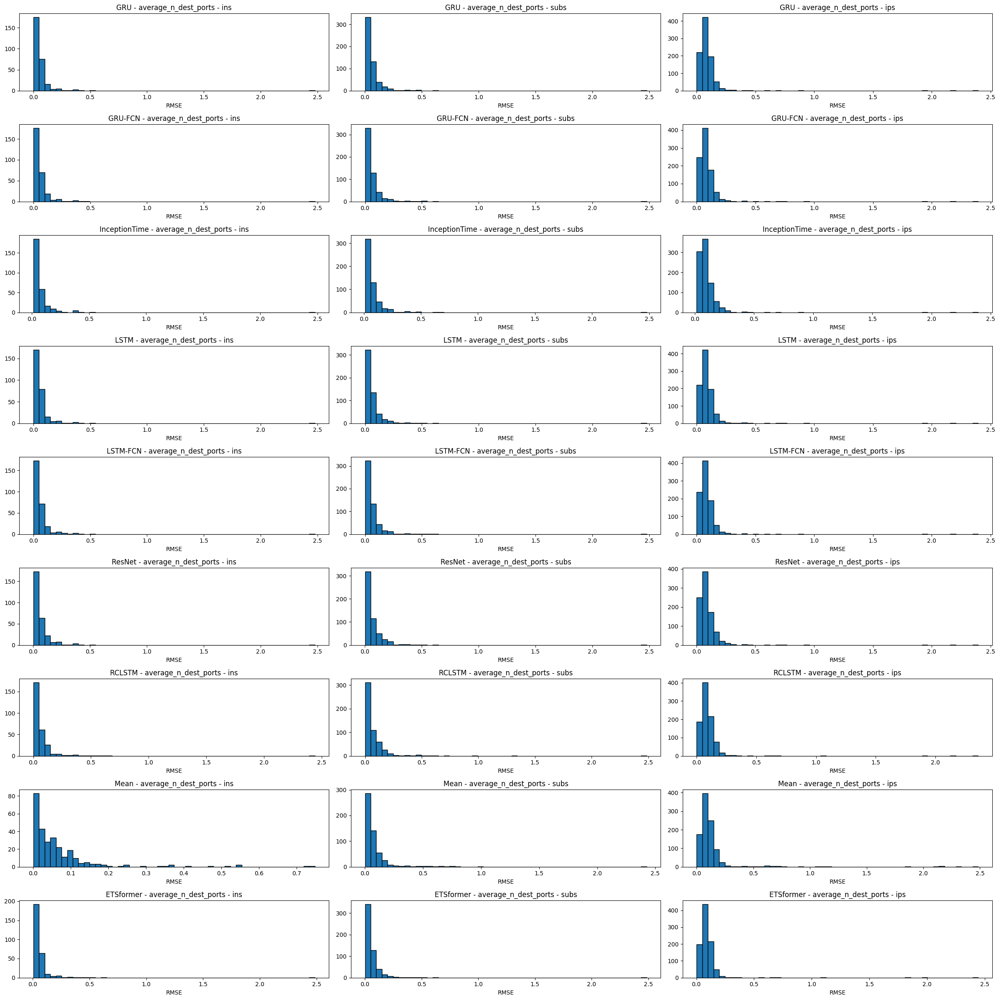

In [26]:
plot_kdes("average_n_dest_ports")

### std_n_dest_asn - Standard deviation of the number of unique destination ASNs

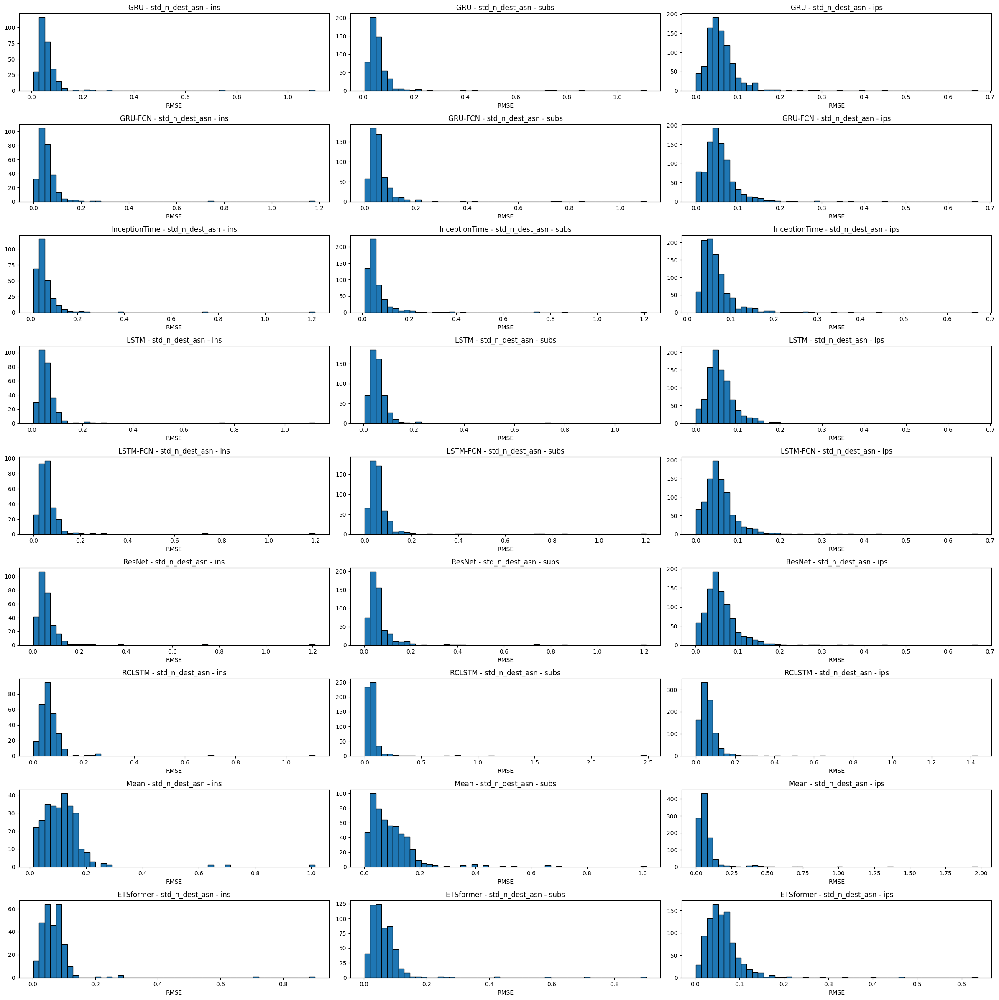

In [27]:
plot_kdes("std_n_dest_asn")

### std_n_dest_ip - Standard deviation of the number of unique destination ASNs

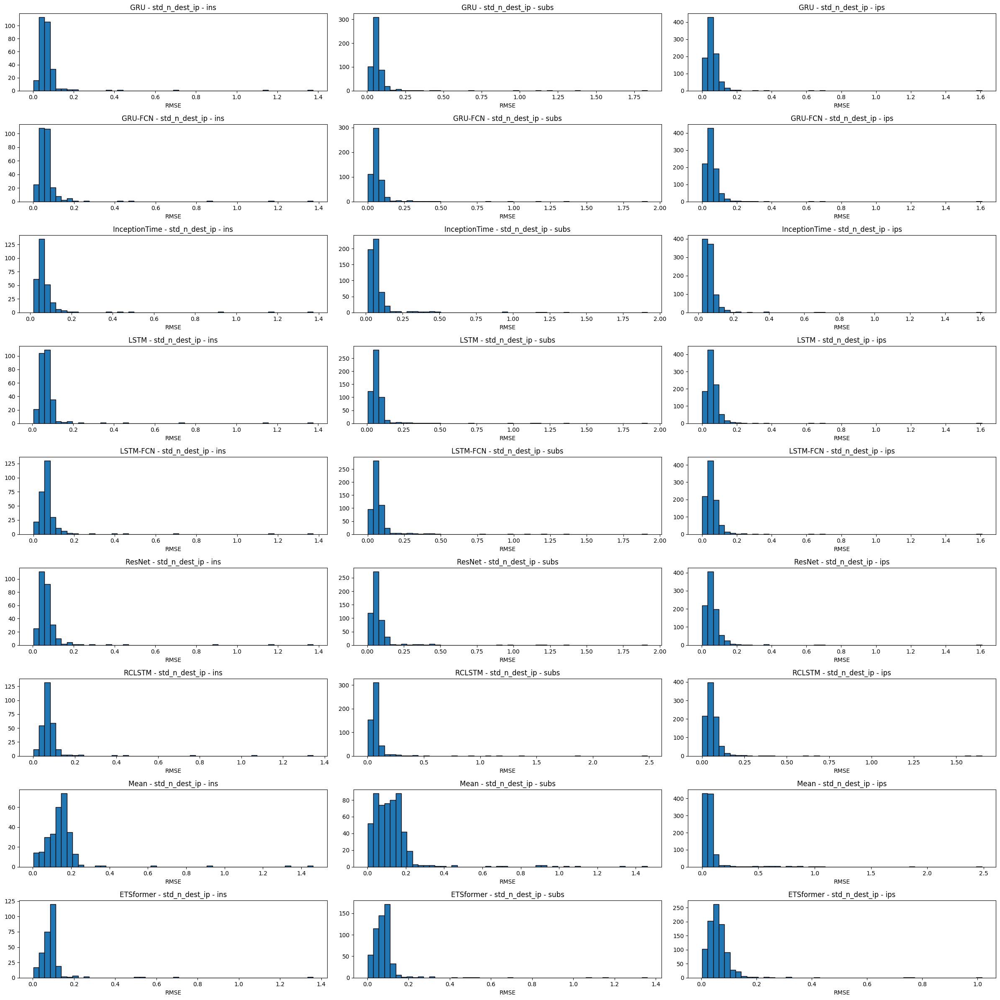

In [28]:
plot_kdes("std_n_dest_ip")

### std_n_dest_ports - Standard deviation of the number of unique destination ports

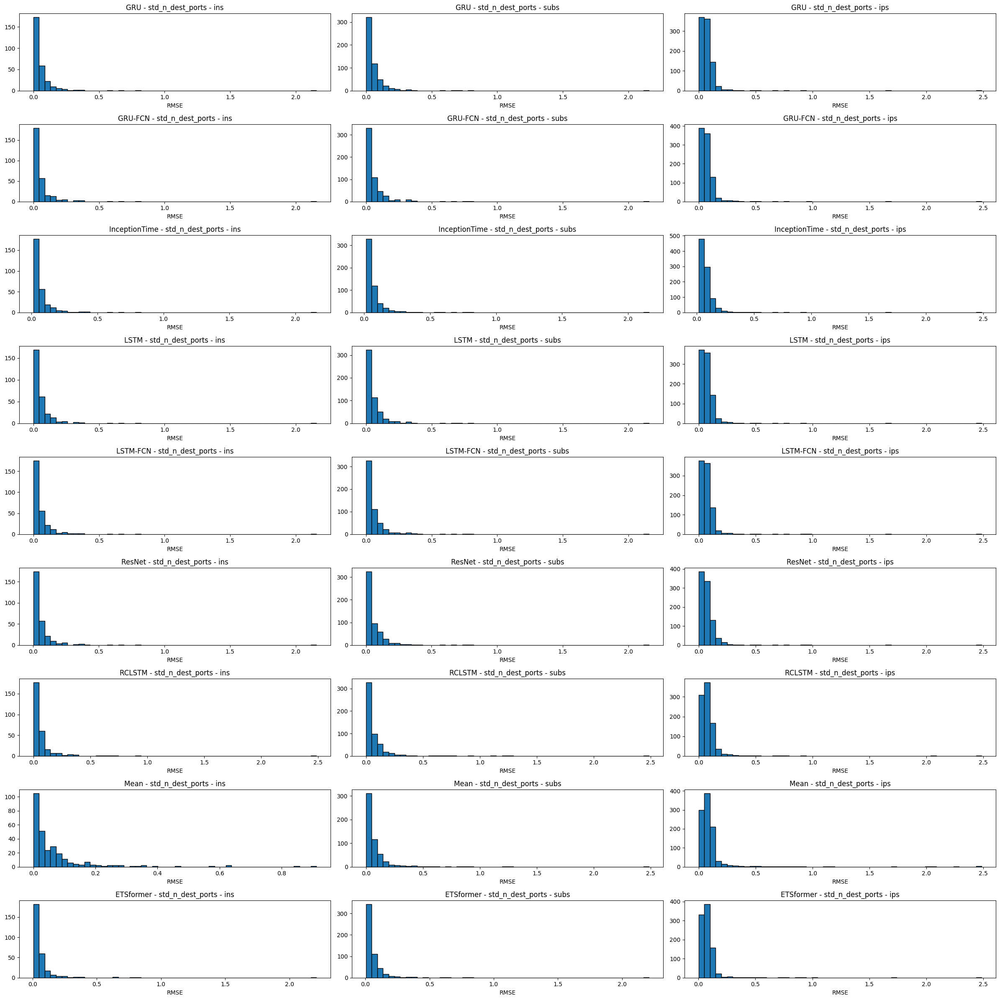

In [29]:
plot_kdes("std_n_dest_ports")

### sum_n_dest_asn - Sum of the number of unique destination ASNs

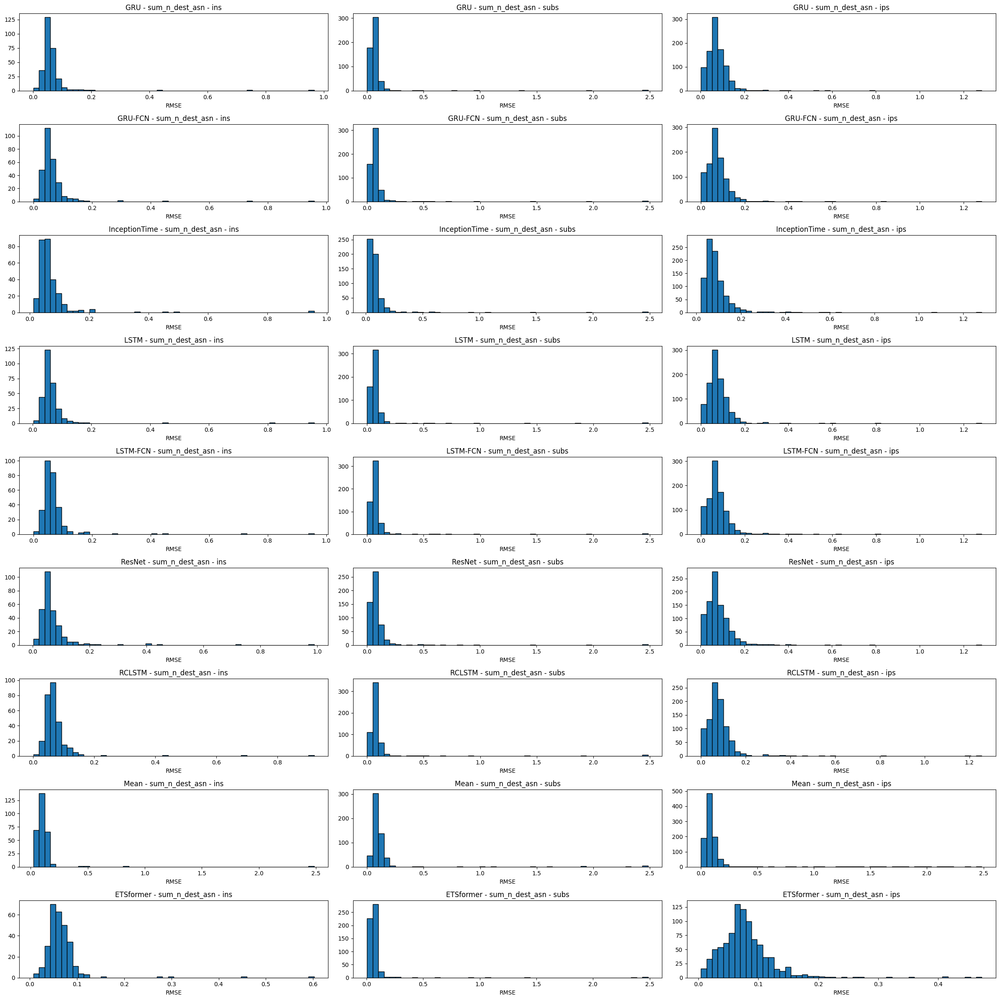

In [30]:
plot_kdes("sum_n_dest_asn")

### sum_n_dest_ip - Sum of the number of unique destination ASNs

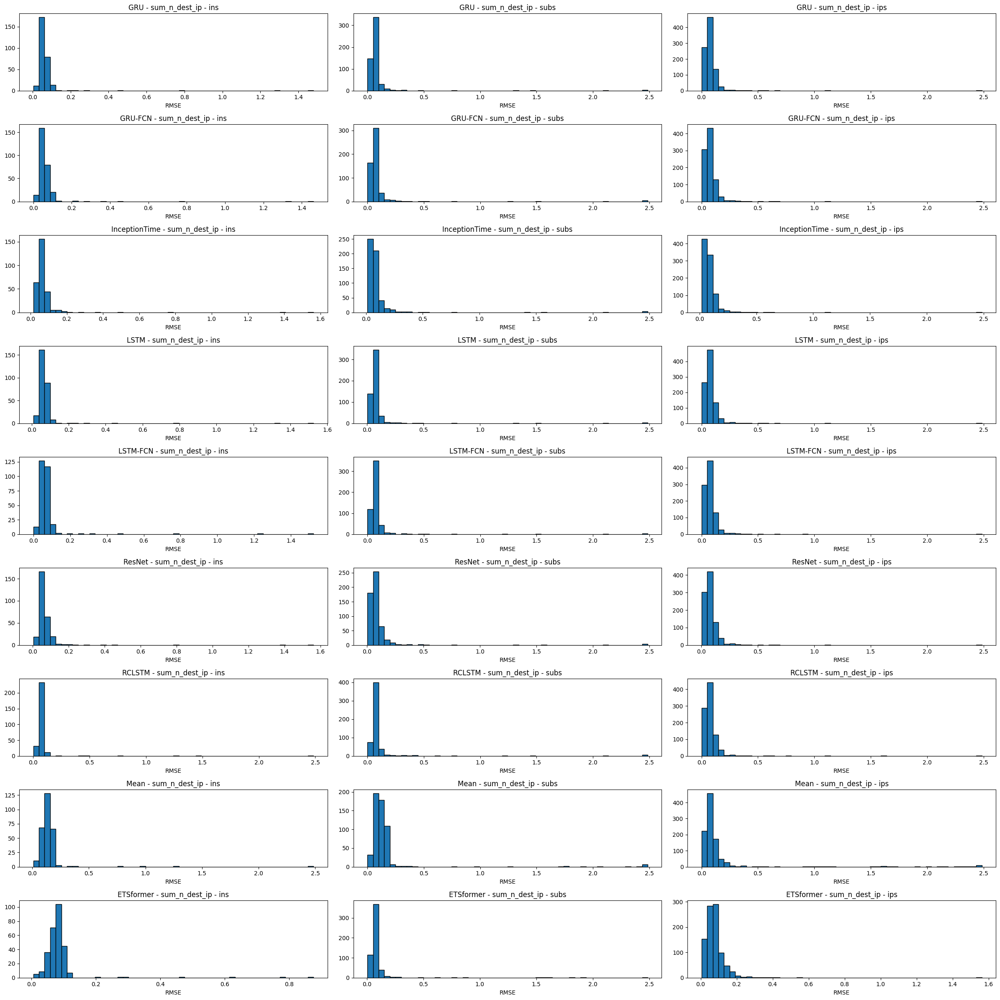

In [31]:
plot_kdes("sum_n_dest_ip")

### sum_n_dest_ports - Sum of the number of unique destination ports

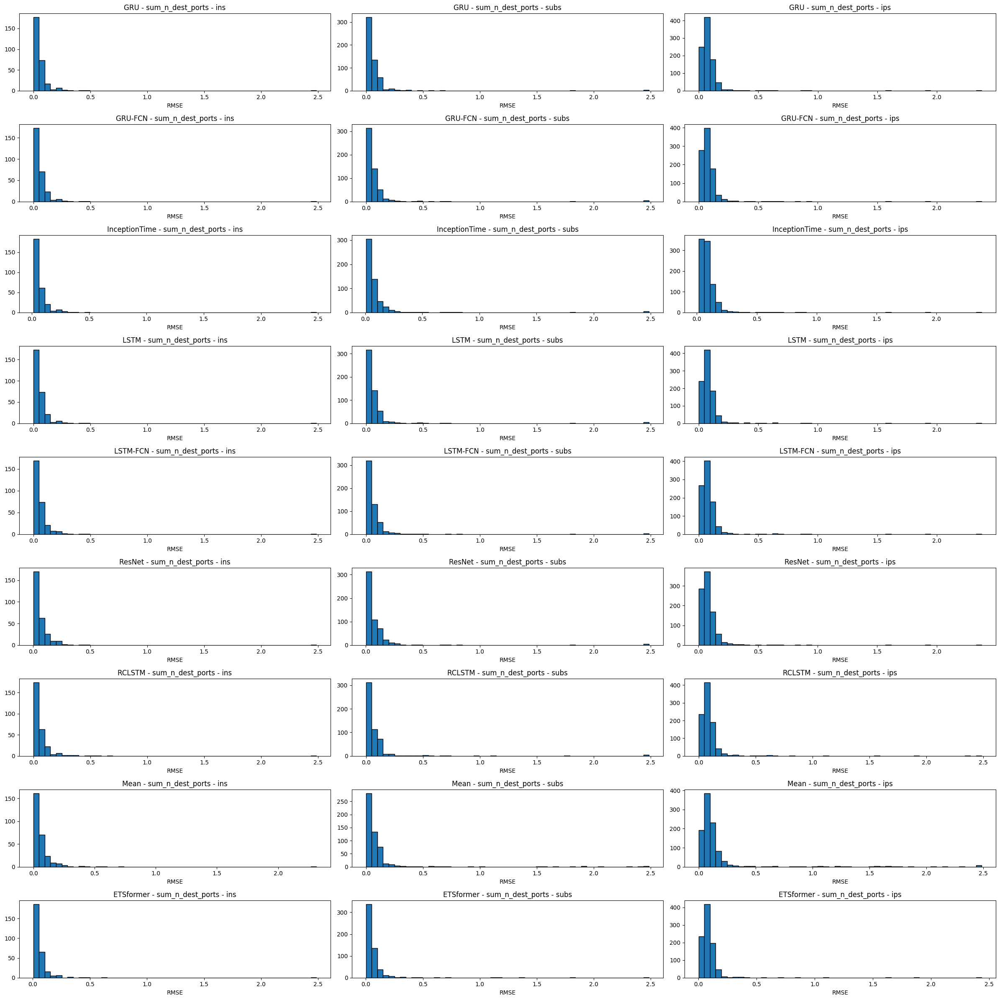

In [32]:
plot_kdes("sum_n_dest_ports")